# Task
Download and extract the archive file from the Google Drive URL "https://drive.google.com/file/d/16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21/view".

## Install gdown

### Subtask:
Install the `gdown` library to download the file from Google Drive.


**Reasoning**:
The subtask is to install the `gdown` library. This can be done using pip in a code block.



In [ ]:
%pip install gdown

## Download the file

### Subtask:
Download the file from the provided Google Drive URL using `gdown`.


**Reasoning**:
Import the gdown library and download the file from the provided Google Drive URL using gdown.download().



In [21]:
import gdown
from IPython.display import display, Image
import os
import pandas as pd
import cv2
import numpy as np
from IPython.display import display, Image

In [ ]:
google_drive_url = "https://drive.google.com/file/d/16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21/view"
gdown.download(google_drive_url, quiet=False)

/usr/local/lib/python3.11/dist-packages/gdown/parse_url.py:48: UserWarning: You specified a Google Drive link that is not the correct link to download a file. You might want to try `--fuzzy` option or the following url: https://drive.google.com/uc?id=16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21
  warnings.warn(
Downloading...
From: https://drive.google.com/file/d/16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21/view
To: /content/view
41.8kB [00:00, 2.65MB/s]


'view'

**Reasoning**:
The file was downloaded but with a warning about the URL format. The warning suggested using the URL https://drive.google.com/uc?id=16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21. Re-download the file using the suggested URL to avoid potential issues.



In [ ]:
google_drive_url_corrected = "https://drive.google.com/uc?id=16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21"
gdown.download(google_drive_url_corrected, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21
To: /content/defective wagon images-20250626T101753Z-1-001.zip
100%|██████████| 14.4M/14.4M [00:00<00:00, 115MB/s]


'defective wagon images-20250626T101753Z-1-001.zip'

## Extract the file

### Subtask:
Extract the contents of the downloaded archive file.


**Reasoning**:
Import the zipfile library, specify the zip file name, create a ZipFile object, extract its contents, and then close the file.



In [ ]:
import zipfile

zip_file_name = 'defective wagon images-20250626T101753Z-1-001.zip'

with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall()

## Summary:

### Data Analysis Key Findings

*   The `gdown` library was successfully used to download the file from the provided Google Drive URL after correcting the URL format to `https://drive.google.com/uc?id=<file_id>`.
*   The downloaded file is a zip archive named 'defective wagon images-20250626T101753Z-1-001.zip'.
*   The contents of the zip archive were successfully extracted using the `zipfile` library.

### Insights or Next Steps

*   The extracted files are likely images of defective wagons, based on the archive's filename, which could be used for further analysis or model training.


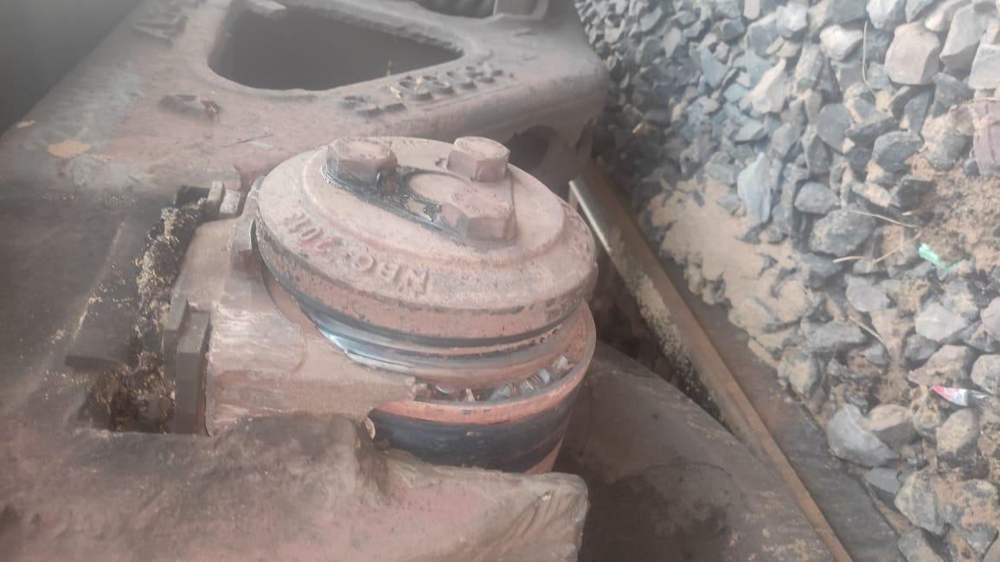

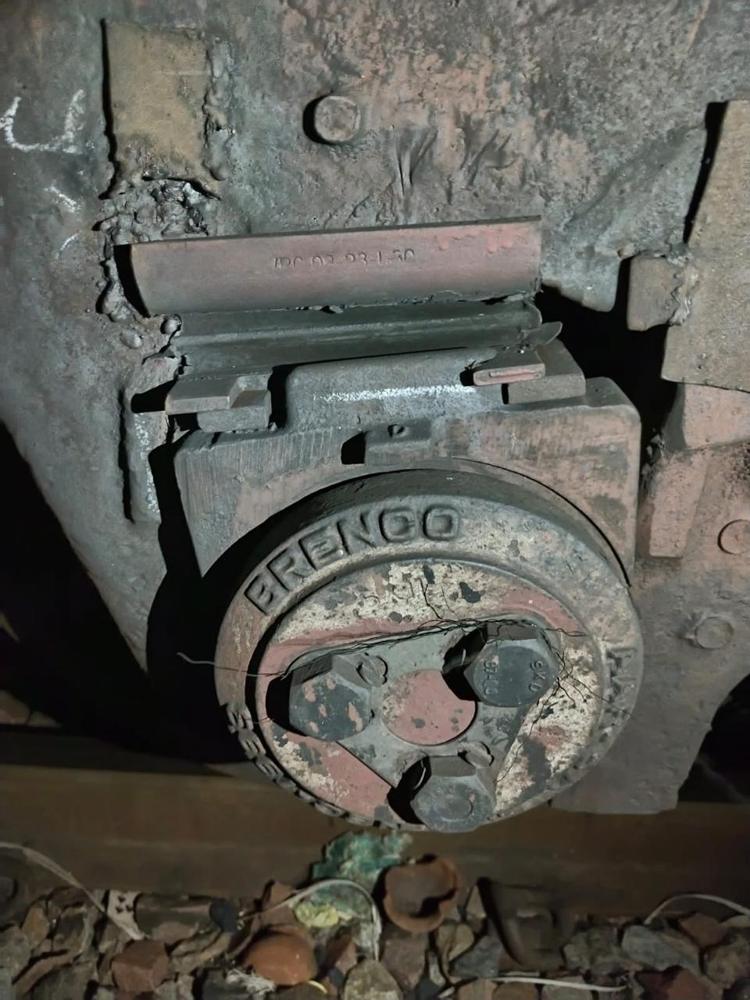

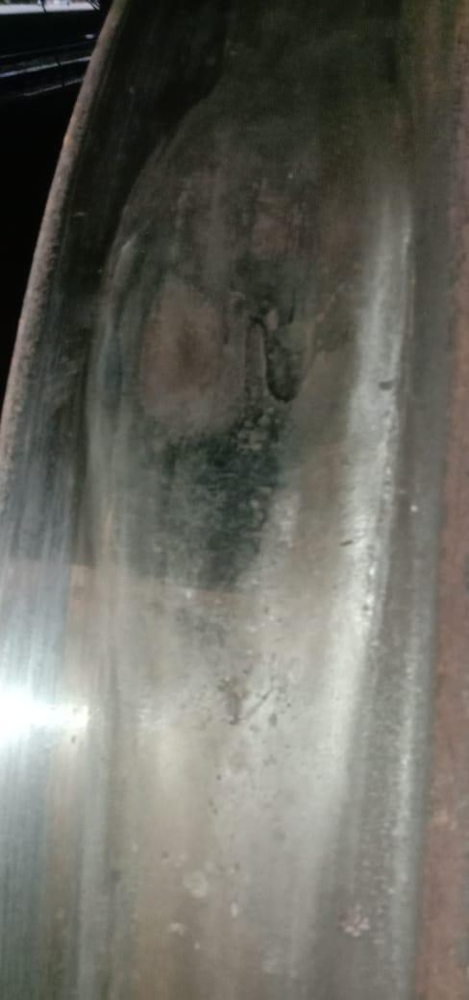

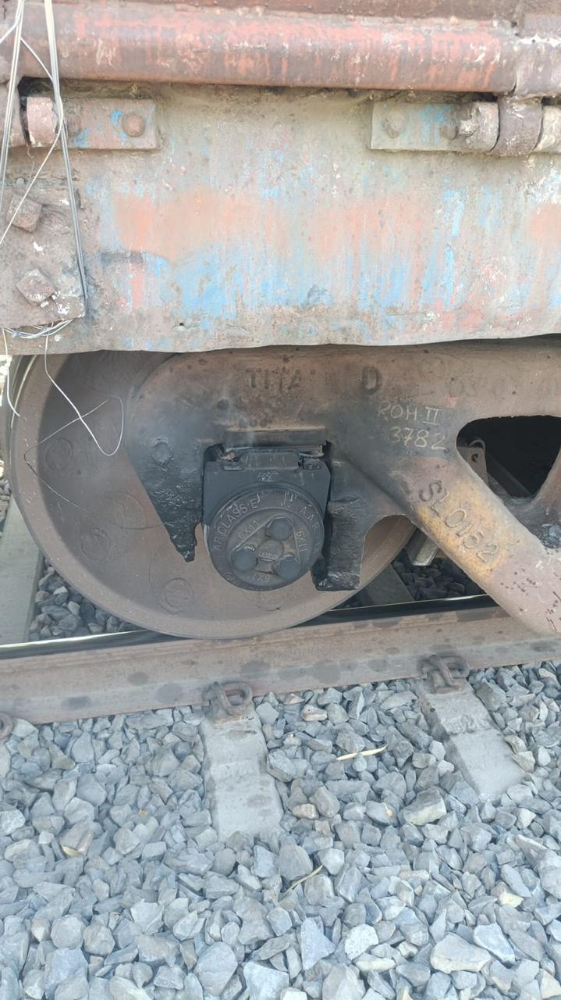

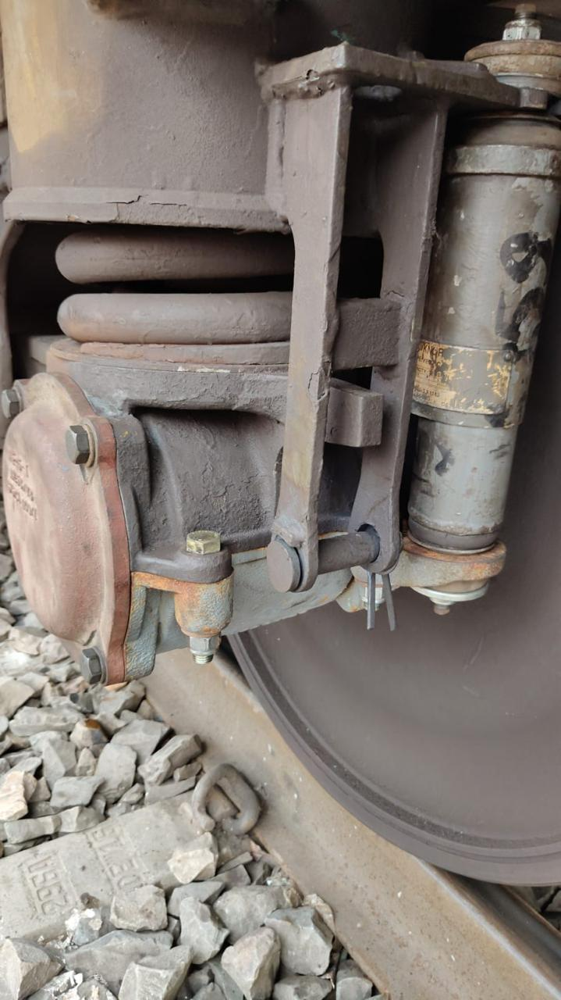

In [ ]:

image_folder = '/content/defective wagon images'

# Get a list of all files in the image folder
image_files = [f for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))]

# Display the first 5 image files
for i in range(min(5, len(image_files))):
    image_path = os.path.join(image_folder, image_files[i])
    display(Image(filename=image_path))

# Task
Detect defects in the images located at "/content/defective wagon images" using the YOLOv11 model.

## Install necessary libraries

### Subtask:
Install libraries required for using YOLOv11, such as PyTorch and ultralytics.


**Reasoning**:
Install the required libraries `ultralytics`, `torch`, and `torchvision` using pip.



In [3]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [5]:
%cd /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset

/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset


In [9]:
os.getcwd()

'/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset'

In [10]:
zenodo_url = "https://zenodo.org/records/13162335/files/Labeled_data_CSV.zip?download=1"
gdown.download(zenodo_url, quiet=False)

Downloading...
From: https://zenodo.org/records/13162335/files/Labeled_data_CSV.zip?download=1
To: /content/drive/MyDrive/Home2/datasets/Labeled_data_CSV.zip?download=1
100%|██████████| 33.3M/33.3M [00:39<00:00, 841kB/s] 


'Labeled_data_CSV.zip?download=1'

In [14]:
zip_file_name = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/Labeled_data_CSV.zip?download=1'

with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall()

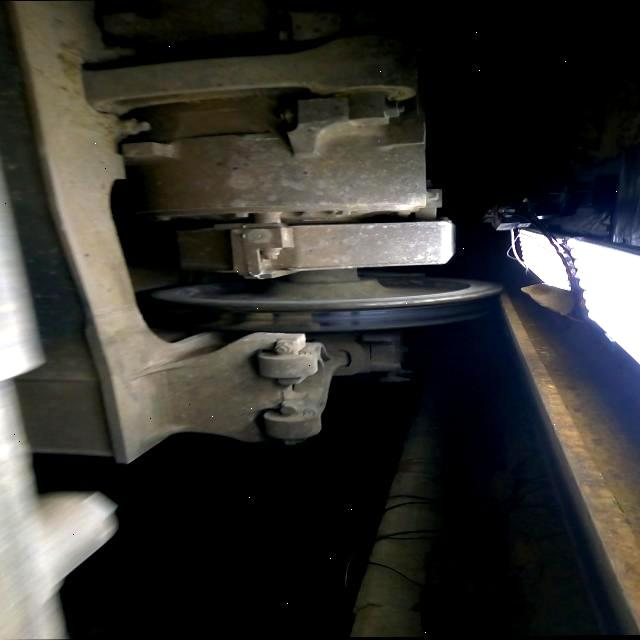

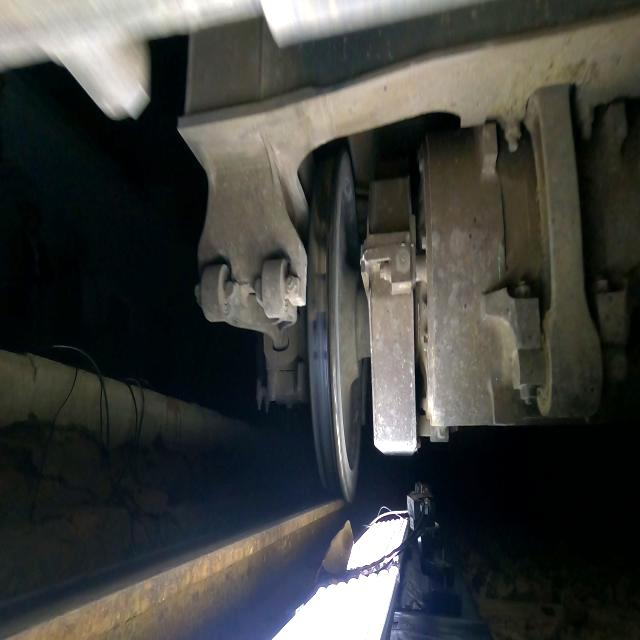

In [17]:
image_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/train'

# Get a list of all files in the image folder
image_files = [f for f in os.listdir(image_folder) if os.path.isfile(os.path.join(image_folder, f))]

# Display the first 5 image files
for i in range(2):
    image_path = os.path.join(image_folder, image_files[i+1])
    display(Image(filename=image_path))

In [19]:
df = pd.read_csv('/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/train/_annotations.csv')

In [20]:
df.sample(5)

,filename,width,height,class,xmin,ymin,xmax,ymax
2374,frame5974_jpg.rf.47fe09efd0daa5edbc8328fa3134c...,640,640,Wheel,297,195,399,522
1896,frame2307_jpg.rf.0f65830e2b50cf4c2c58e013ee25e...,640,640,Cracks-Scratches,258,401,290,415
1052,frame1503_jpg.rf.620ea39a83263b2f7acd79d80493e...,640,640,Shelling,298,180,337,291
1734,frame1517_jpg.rf.0037d461dc4007a000578fb26ce60...,640,640,Cracks-Scratches,291,352,299,397
598,frame5987_jpg.rf.c56fc103fc19af71d73a69fceacad...,640,640,Shelling,111,244,256,297


In [ ]:
import os
import shutil

source_directory = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset'

# Iterate through all items in the source directory
for item in os.listdir(source_directory):
    item_path = os.path.join(source_directory, item)

    # Check if the item is a directory
    if os.path.isdir(item_path):
        # Create the 'images' subdirectory if it doesn't exist
        images_subdirectory = os.path.join(item_path, 'images')
        os.makedirs(images_subdirectory, exist_ok=True)

        # Iterate through files in the current subdirectory
        for file_name in os.listdir(item_path):
            file_path = os.path.join(item_path, file_name)

            # Check if the item is a file and if it's an image (you might need to adjust the extensions)
            if os.path.isfile(file_path) and file_name.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                # Construct the destination path
                destination_path = os.path.join(images_subdirectory, file_name)

                # Move the file
                shutil.move(file_path, destination_path)
                print(f"Moved: {file_path} to {destination_path}")

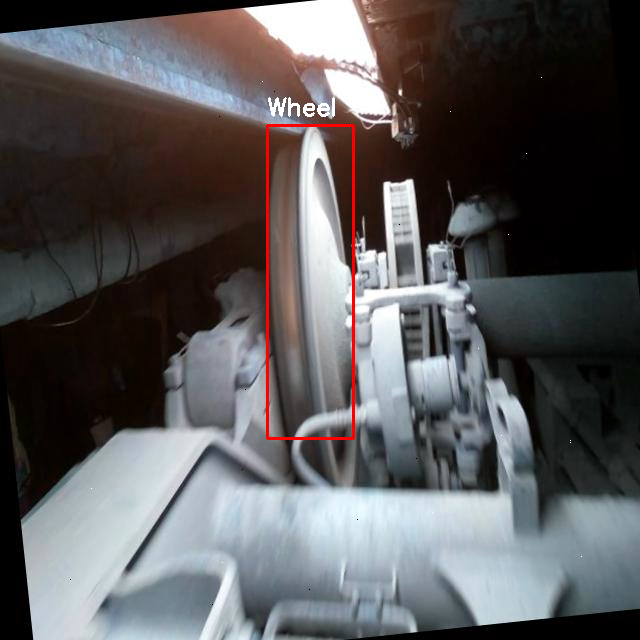

In [22]:
# Read the first row of the dataframe
first_row = df.iloc[0]

# Get the image filename and bounding box information
image_filename = first_row['filename']
xmin = int(first_row['xmin'])
ymin = int(first_row['ymin'])
xmax = int(first_row['xmax'])
ymax = int(first_row['ymax'])
class_name = first_row['class']

# Construct the full path to the image file
image_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/train/images' # Assuming images are in the 'images' subfolder within 'train'
image_path = os.path.join(image_folder, image_filename)

# Read the image
image = cv2.imread(image_path)

# Draw the bounding box on the image
color = (255, 0, 0)  # Blue color for the bounding box
thickness = 2
image_with_box = cv2.rectangle(image, (xmin, ymin), (xmax, ymax), color, thickness)

# Add the class name as text near the bounding box
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 0.8
font_thickness = 2
text_color = (255, 255, 255)  # White color for the text
text_offset_x = xmin
text_offset_y = ymin - 10 if ymin - 10 > 10 else ymin + 10 # Adjust text position

cv2.putText(image_with_box, class_name, (text_offset_x, text_offset_y), font, font_scale, text_color, font_thickness)

# Display the image with the bounding box and class name
# OpenCV uses BGR format, but PIL/IPython display expects RGB. Convert if necessary.
image_rgb = cv2.cvtColor(image_with_box, cv2.COLOR_BGR2RGB)
display(Image(data=cv2.imencode('.png', image_rgb)[1].tobytes()))

In [23]:
# Create a mapping for class names to integer IDs using the original df
class_names = df['class'].unique()
class_map = {name: i for i, name in enumerate(class_names)}

# Create the new DataFrame df_modified and add the 'filename' column
df_modified = pd.DataFrame()
df_modified['filename'] = df['filename']

# Add the 'class_ids' column to df_modified
df_modified['class_ids'] = df['class'].map(class_map)

# Calculate normalized center_x, center_y, width, and height and add to df_modified
df_modified['center_x'] = ((df['xmin'] + df['xmax']) / 2) / df['width']
df_modified['center_y'] = ((df['ymin'] + df['ymax']) / 2) / df['height']
df_modified['width'] = (df['xmax'] - df['xmin']) / df['width']
df_modified['height'] = (df['ymax'] - df['ymin']) / df['height']

# Display the head of the new DataFrame
display(df_modified.head())

,filename,class_ids,center_x,center_y,width,height
0,frame9107_jpg.rf.f1522310aabc9f8d379071f287351...,0,0.484375,0.439844,0.134375,0.489063
1,frame9107_jpg.rf.f1522310aabc9f8d379071f287351...,1,0.459375,0.578906,0.028125,0.073438
2,frame6545_jpg.rf.f0320838251ec6fc8c2bb15045916...,0,0.543750,0.580469,0.750000,0.214062
3,frame6545_jpg.rf.f0320838251ec6fc8c2bb15045916...,2,0.376563,0.642188,0.059375,0.018750
4,frame6545_jpg.rf.f0320838251ec6fc8c2bb15045916...,1,0.807031,0.650781,0.076563,0.045312


In [24]:
import os
import pandas as pd

# Define the base dataset directory
dataset_base_dir = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset'

# --- Process Training Data ---

# Define paths for training data
train_annotations_path = os.path.join(dataset_base_dir, 'train', '_annotations.csv')
train_labels_folder = os.path.join(dataset_base_dir, 'train', 'labels')

# Create the train labels folder if it doesn't exist
os.makedirs(train_labels_folder, exist_ok=True)

# Read the training annotations CSV
df_train = pd.read_csv(train_annotations_path)

# Create a mapping for class names to integer IDs (using the combined unique classes if necessary, but for simplicity here, assuming train covers all classes)
class_names = df_train['class'].unique()
class_map = {name: i for i, name in enumerate(class_names)}

# Create the modified training DataFrame
df_train_modified = pd.DataFrame()
df_train_modified['filename'] = df_train['filename']
df_train_modified['class_ids'] = df_train['class'].map(class_map)
df_train_modified['center_x'] = ((df_train['xmin'] + df_train['xmax']) / 2) / df_train['width']
df_train_modified['center_y'] = ((df_train['ymin'] + df_train['ymax']) / 2) / df_train['height']
df_train_modified['width'] = (df_train['xmax'] - df_train['xmin']) / df_train['width']
df_train_modified['height'] = (df_train['ymax'] - df_train['ymin']) / df_train['height']

# Group the training dataframe by filename
grouped_df_train = df_train_modified.groupby('filename')

# Iterate through each training image and create its annotation file
for filename, group in grouped_df_train:
    txt_filename = os.path.splitext(filename)[0] + '.txt'
    txt_filepath = os.path.join(train_labels_folder, txt_filename)

    with open(txt_filepath, 'w') as f:
        for index, row in group.iterrows():
            line = f"{int(row['class_ids'])} {row['center_x']} {row['center_y']} {row['width']} {row['height']}\n"
            f.write(line)

print(f"Training annotation files created in: {train_labels_folder}")

# --- Process Validation Data ---

# Define paths for validation data
valid_annotations_path = os.path.join(dataset_base_dir, 'valid', '_annotations.csv')
valid_labels_folder = os.path.join(dataset_base_dir, 'valid', 'labels')

# Create the valid labels folder if it doesn't exist
os.makedirs(valid_labels_folder, exist_ok=True)

# Read the validation annotations CSV
df_valid = pd.read_csv(valid_annotations_path)

# Use the same class_map created from the training data to ensure consistent class_ids
df_valid_modified = pd.DataFrame()
df_valid_modified['filename'] = df_valid['filename']
df_valid_modified['class_ids'] = df_valid['class'].map(class_map)
df_valid_modified['center_x'] = ((df_valid['xmin'] + df_valid['xmax']) / 2) / df_valid['width']
df_valid_modified['center_y'] = ((df_valid['ymin'] + df_valid['ymax']) / 2) / df_valid['height']
df_valid_modified['width'] = (df_valid['xmax'] - df_valid['xmin']) / df_valid['width']
df_valid_modified['height'] = (df_valid['ymax'] - df_valid['ymin']) / df_valid['height']

# Group the validation dataframe by filename
grouped_df_valid = df_valid_modified.groupby('filename')

# Iterate through each validation image and create its annotation file
for filename, group in grouped_df_valid:
    txt_filename = os.path.splitext(filename)[0] + '.txt'
    txt_filepath = os.path.join(valid_labels_folder, txt_filename)

    with open(txt_filepath, 'w') as f:
        for index, row in group.iterrows():
            line = f"{int(row['class_ids'])} {row['center_x']} {row['center_y']} {row['width']} {row['height']}\n"
            f.write(line)

print(f"Validation annotation files created in: {valid_labels_folder}")

Training annotation files created in: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/train/labels
Validation annotation files created in: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/valid/labels


In [28]:
import yaml
import os
from collections import OrderedDict

# Define the base dataset directory
dataset_base_dir = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset'

# Define paths for the train and validation image directories
train_images_path = os.path.join(dataset_base_dir, 'train', 'images')
valid_images_path = os.path.join(dataset_base_dir, 'valid', 'images')
# Placeholder for test images path - using the requested relative path
test_images_path = '../test/images'


# Get the class names from the class_map created earlier
# Assuming 'class_map' is available from previous steps
class_names = list(class_map.keys())
num_classes = len(class_names)

# Create the data dictionary for the YAML file in the specified order and format
# Using OrderedDict to ensure key order is preserved
data = OrderedDict([
    ('train', train_images_path),
    ('val', valid_images_path),
    ('test', test_images_path),
    ('nc', num_classes),
    ('names', class_names) # Ensure names is a list
])

# Define the path where the data.yaml file will be saved
yaml_file_path = os.path.join(dataset_base_dir, 'data.yaml')

# Write the data to the YAML file
# Use default_flow_style=None to ensure list is not inline if it has multiple items
with open(yaml_file_path, 'w') as f:
    yaml.dump(data, f, default_flow_style=None)

print(f"data.yaml file created at: {yaml_file_path}")

# Read and display the content of the created data.yaml file
print("\nContent of data.yaml:")
with open(yaml_file_path, 'r') as f:
    print(f.read())

data.yaml file created at: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml

Content of data.yaml:
!!python/object/apply:collections.OrderedDict
- - [train, /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/train/images]
  - [val, /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/valid/images]
  - [test, ../test/images]
  - [nc, 4]
  - - names
    - [Wheel, Shelling, Cracks-Scratches, Discoloration]



In [29]:
import os

# Define the base dataset directory
dataset_base_dir = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset'

# Define paths for the train and validation image directories
train_images_path = os.path.join(dataset_base_dir, 'train', 'images')
valid_images_path = os.path.join(dataset_base_dir, 'valid', 'images')
# Placeholder for test images path - using the requested relative path
test_images_path = '../test/images'

# Get the class names from the class_map created earlier
# Assuming 'class_map' is available from previous steps
class_names = list(class_map.keys())
num_classes = len(class_names)

# Manually format the content of the data.yaml file
yaml_content = f"""train: {train_images_path}
val: {valid_images_path}
test: {test_images_path}

nc: {num_classes}
names: {class_names}
"""

# Define the path where the data.yaml file will be saved
yaml_file_path = os.path.join(dataset_base_dir, 'data.yaml')

# Write the manually formatted content to the YAML file
with open(yaml_file_path, 'w') as f:
    f.write(yaml_content)

print(f"data.yaml file created at: {yaml_file_path}")

# Read and display the content of the created data.yaml file
print("\nContent of data.yaml:")
with open(yaml_file_path, 'r') as f:
    print(f.read())

data.yaml file created at: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml

Content of data.yaml:
train: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/train/images
val: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/valid/images
test: ../test/images

nc: 4
names: ['Wheel', 'Shelling', 'Cracks-Scratches', 'Discoloration']



In [7]:
!nvidia-smi

Thu Jun 26 14:01:53 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8             12W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [6]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 41.7/107.7 GB disk)


In [10]:
import os
import shutil

# Define the path to the test images folder
test_images_folder = os.path.join(os.getcwd(), 'test', 'images')

# Check if the directory exists
if os.path.exists(test_images_folder):
    # Iterate over all items in the directory
    for item in os.listdir(test_images_folder):
        item_path = os.path.join(test_images_folder, item)
        # If it's a file, delete it
        if os.path.isfile(item_path):
            os.remove(item_path)
            print(f"Deleted file: {item_path}")
        # If it's a directory, remove it and its contents
        elif os.path.isdir(item_path):
            shutil.rmtree(item_path)
            print(f"Deleted directory: {item_path}")
    print(f"All files and subdirectories in {test_images_folder} have been deleted.")
else:
    print(f"The directory {test_images_folder} does not exist.")

Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/frame1669_jpg.rf.fbb0d3e03b5cb6a816ee6593ecad1fcf.jpg
Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/frame2304_jpg.rf.0188ac25e86fafbbdc3ca9a47b63a8e5.jpg
Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/frame5983_jpg.rf.98d31089c12ce2dd44b48584b54d6fcb.jpg
Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/frame5999_jpg.rf.937c5781e2b5d9b40329784617c0f553.jpg
Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/frame6001_jpg.rf.ab5d0c19875eb9f6b4e6a84d4805a1bc.jpg
Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/frame6544_jpg.rf.b8c970ea3f9f76ca0fc76f098110e578.jpg
Deleted file: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/imag

In [11]:
import gdown

google_drive_url = "https://drive.google.com/file/d/16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21/view"
# It's often better to use the 'uc' link for direct download
google_drive_url_corrected = "https://drive.google.com/uc?id=16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21"

# Define the download destination within the test images folder
test_images_folder = os.path.join(os.getcwd(), 'test', 'images')
download_destination = os.path.join(test_images_folder, 'downloaded_archive.zip') # You can name the file as needed

# Ensure the test/images directory exists before downloading
os.makedirs(test_images_folder, exist_ok=True)

print(f"Downloading file from {google_drive_url_corrected} to {download_destination}")
gdown.download(google_drive_url_corrected, download_destination, quiet=False)

Downloading...
From: https://drive.google.com/uc?id=16b6NAGo0u1PphTZ_OmA8LZDIuAtwld21
To: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/downloaded_archive.zip
100%|██████████| 14.4M/14.4M [00:00<00:00, 32.6MB/s]


'/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/downloaded_archive.zip'

In [12]:
import zipfile
import os

# Define the path to the downloaded zip file
test_images_folder = os.path.join(os.getcwd(), 'test', 'images')
zip_file_path = os.path.join(test_images_folder, 'downloaded_archive.zip') # Use the same name as in the download step

# Define the extraction directory (e.g., the test images folder itself)
extraction_directory = test_images_folder

# Check if the zip file exists
if os.path.exists(zip_file_path):
    print(f"Extracting archive: {zip_file_path}")
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extraction_directory)
    print(f"Archive extracted to: {extraction_directory}")

    # Optional: Remove the zip file after extraction
    # os.remove(zip_file_path)
    # print(f"Removed zip file: {zip_file_path}")
else:
    print(f"Zip file not found at: {zip_file_path}")

Extracting archive: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/downloaded_archive.zip
Archive extracted to: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images


In [15]:
!yolo task=detect mode=train model=yolo11n.pt data="/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml" epochs=10 batch=32 imgsz=640 plots=True

100% 5.35M/5.35M [00:00<00:00, 113MB/s]
Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimiz

In [7]:
from ultralytics import YOLO
import os
from IPython.display import display, Image

# Define the path to the trained model weights
model_path = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect/train/weights/best.pt'

# Load the trained YOLO model
model = YOLO(model_path)

# Define the path to the specific image for prediction
image_to_predict = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (1).jpeg'

print(f"Running detection on: {image_to_predict}")

# Run inference on the single image
# The results will be saved in a 'runs/detect/predict' directory by default
results = model.predict(source=image_to_predict, save=True)

# Display the result for the single image
# The saved result for a single image is typically in the latest 'runs/detect/predict' directory
output_base_dir = 'runs/detect'

# Find the latest prediction run directory
latest_run_dir = None
# List directories starting with 'predict' in the output base directory
run_dirs = [d for d in os.listdir(output_base_dir) if os.path.isdir(os.path.join(output_base_dir, d)) and d.startswith('predict')]
# Sort directories by modification time to find the latest
run_dirs.sort(key=lambda x: os.path.getmtime(os.path.join(output_base_dir, x)), reverse=True)

if run_dirs:
    latest_run_dir = os.path.join(output_base_dir, run_dirs[0])
    # Construct the path to the predicted image file in the latest run directory
    predicted_image_name = os.path.basename(image_to_predict)
    predicted_image_path = os.path.join(latest_run_dir, predicted_image_name)

    # Check if the predicted image exists and display it
    if os.path.exists(predicted_image_path):
        print(f"Displaying detection result for: {predicted_image_name} from {latest_run_dir}")
        display(Image(filename=predicted_image_path))
    else:
        print(f"Predicted image not found at: {predicted_image_path}")
else:
    print(f"No YOLO prediction output directories found in {output_base_dir}")

Running detection on: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (1).jpeg

image 1/1 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (1).jpeg: 480x640 (no detections), 364.6ms
Speed: 22.3ms preprocess, 364.6ms inference, 10.7ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict
Predicted image not found at: runs/detect/predict/WhatsApp Image 2024-10-22 at 5.35.09 PM (1).jpeg


In [8]:
from ultralytics import YOLO
from IPython.display import display, Image
import os

# Define file paths
model_path = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect/train/weights/best.pt'
image_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images'
label_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/labels'

# Create the output label folder
os.makedirs(label_folder, exist_ok=True)

# Load the fine-tuned model
model = YOLO(model_path)

# Run prediction, save images with boxes, but do not save txt files automatically
# We will create the txt files manually to control the output directory. [8]
results = model.predict(source=image_folder, save=True, conf=0.2)

# Process results to create label files
for r in results:
    # Define the output text file path based on the image name
    base_name = os.path.splitext(os.path.basename(r.path))[0]
    txt_path = os.path.join(label_folder, f"{base_name}.txt")

    with open(txt_path, 'w') as f:
        # Get normalized bounding boxes (xywhn) and class IDs
        boxes = r.boxes.xywhn
        classes = r.boxes.cls
        for i in range(len(boxes)):
            # Format: class_id center_x center_y width height
            line = f"{int(classes[i])} {boxes[i][0]} {boxes[i][1]} {boxes[i][2]} {boxes[i][3]}\n"
            f.write(line)

print(f"Label files saved to: {label_folder}")

# Display the first 2 predicted images
output_dir = results[0].save_dir
predicted_images = os.listdir(output_dir)


image 1/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (1).jpeg: 480x640 (no detections), 263.3ms
image 2/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (2).jpeg: 480x640 (no detections), 624.6ms
image 3/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM.jpeg: 640x384 (no detections), 224.9ms
image 4/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.10 PM (1).jpeg: 640x384 (no detections), 148.4ms
image 5/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.10 PM.jpeg: 640x384 (no detections), 160.6ms
im

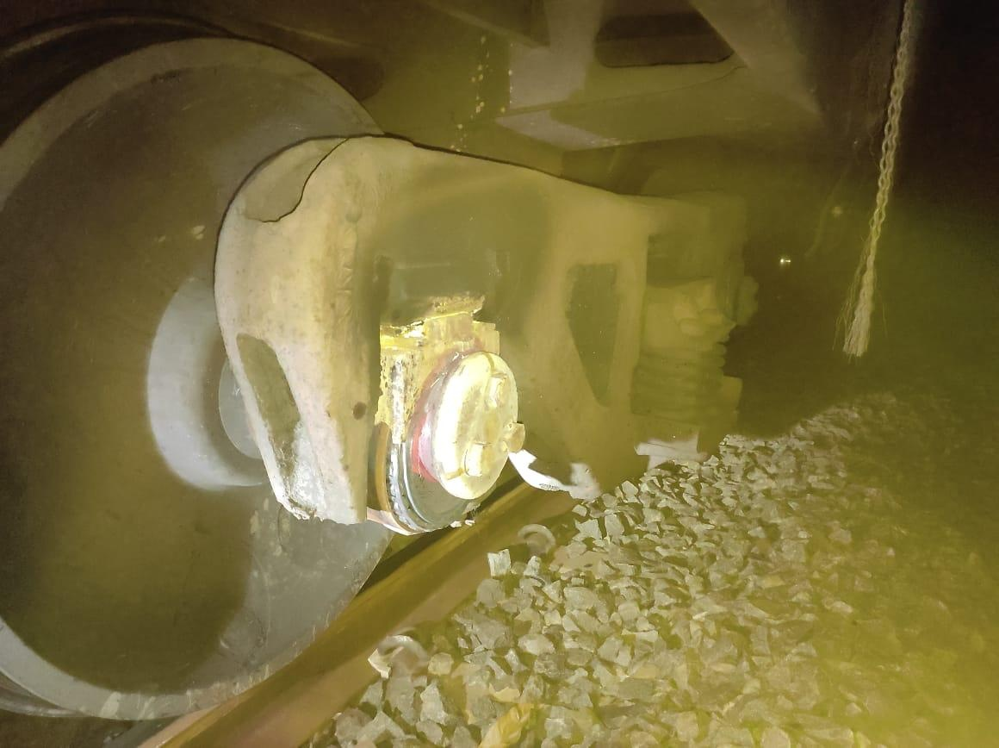

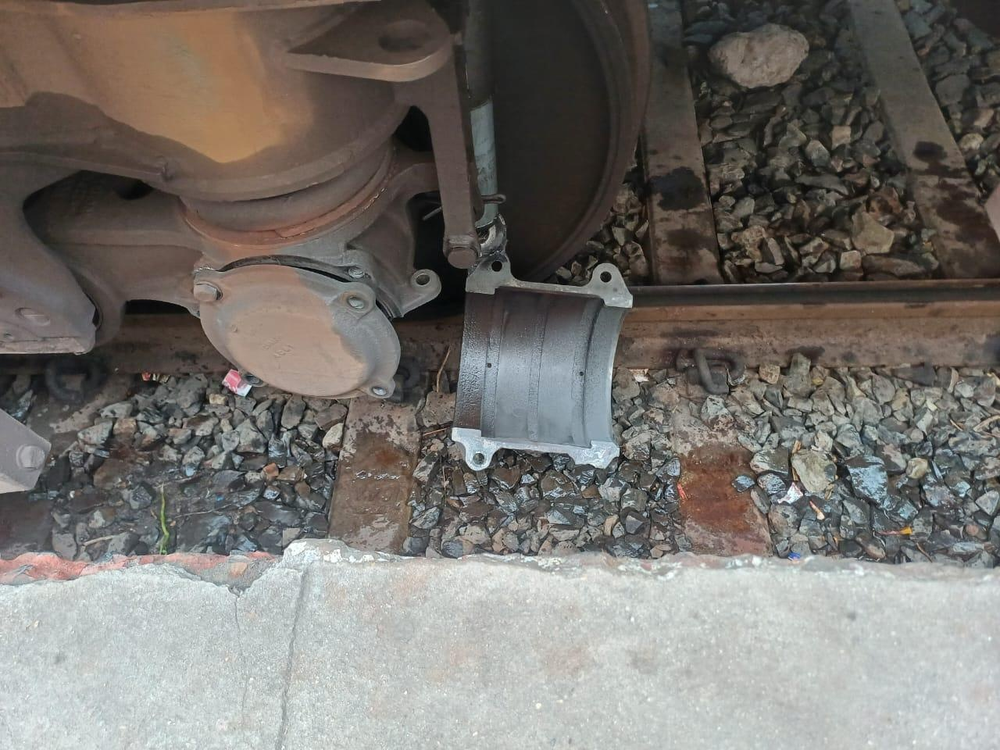

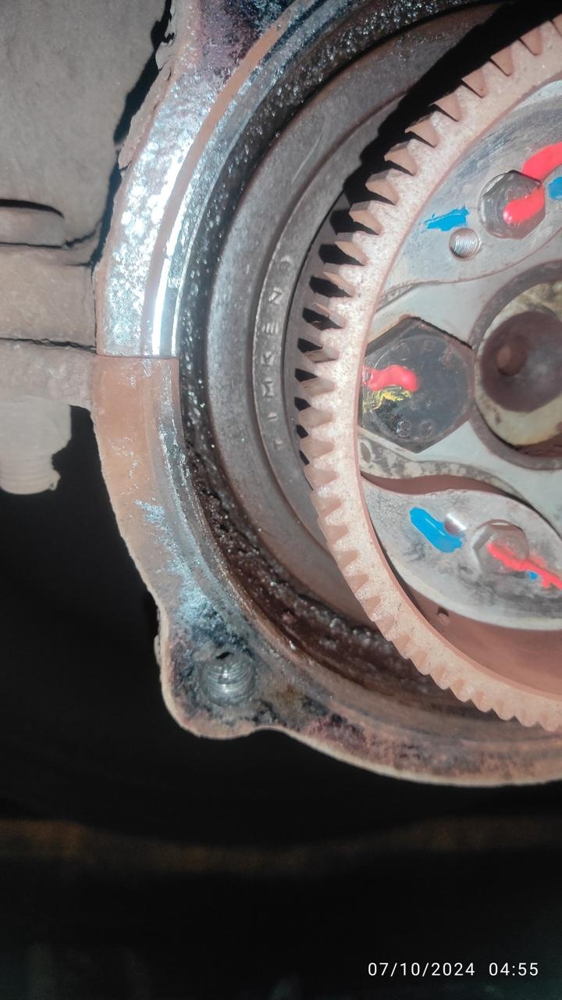

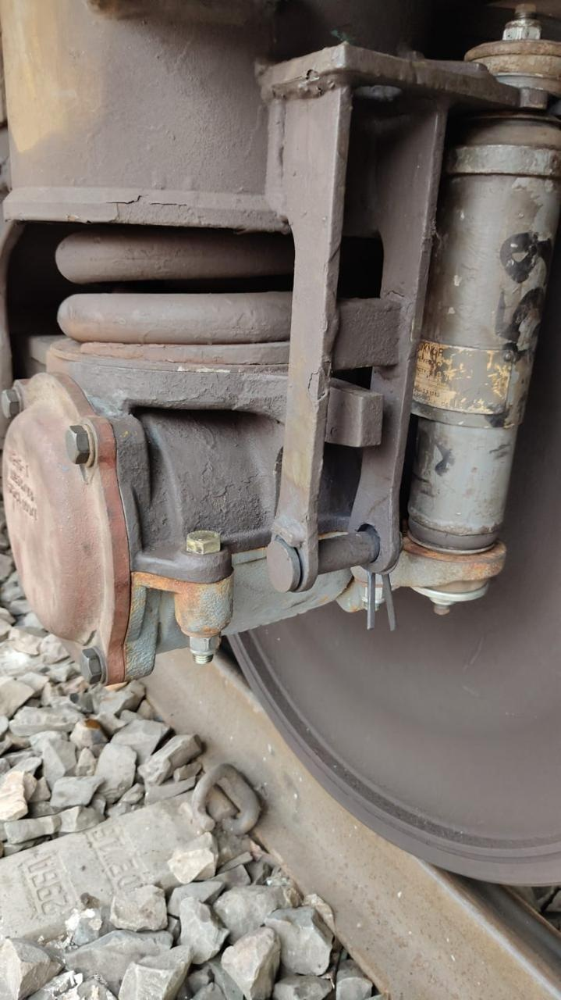

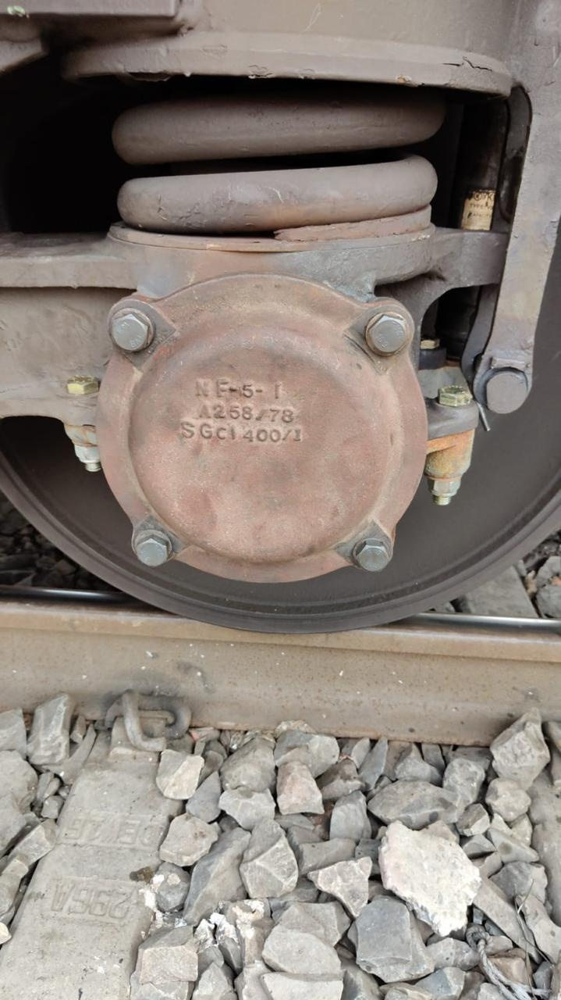

...

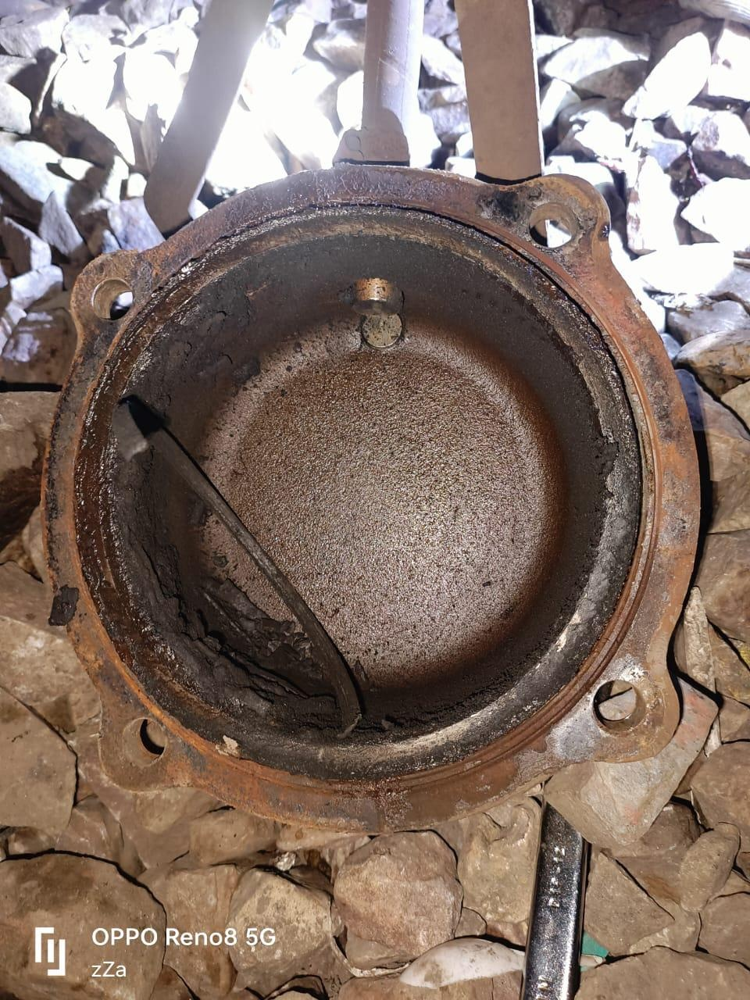

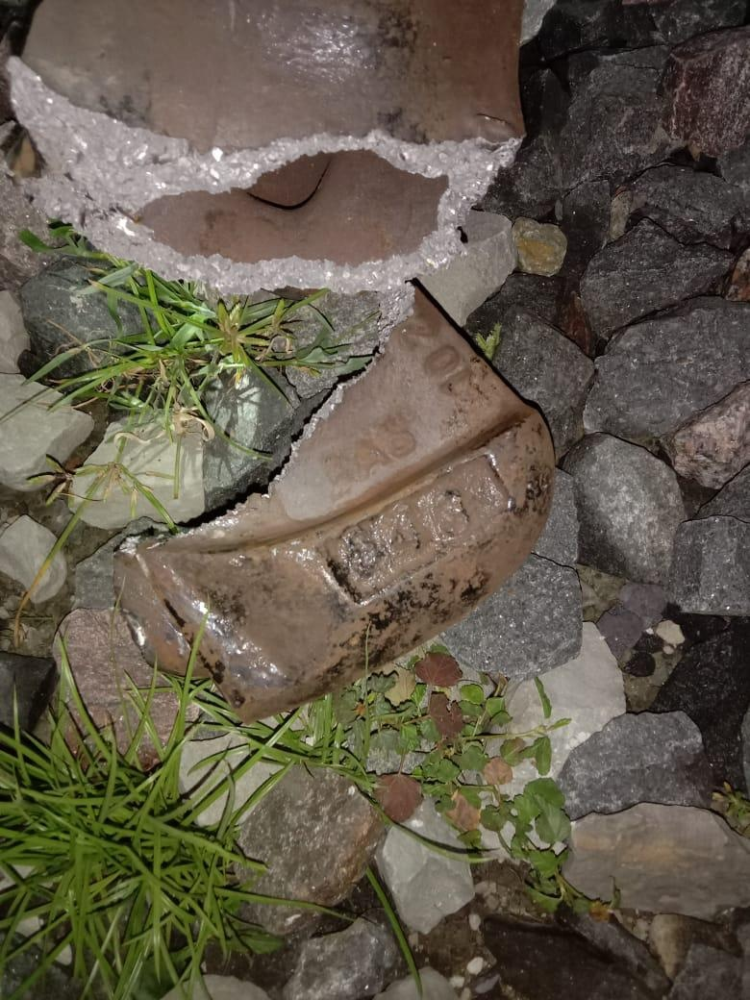

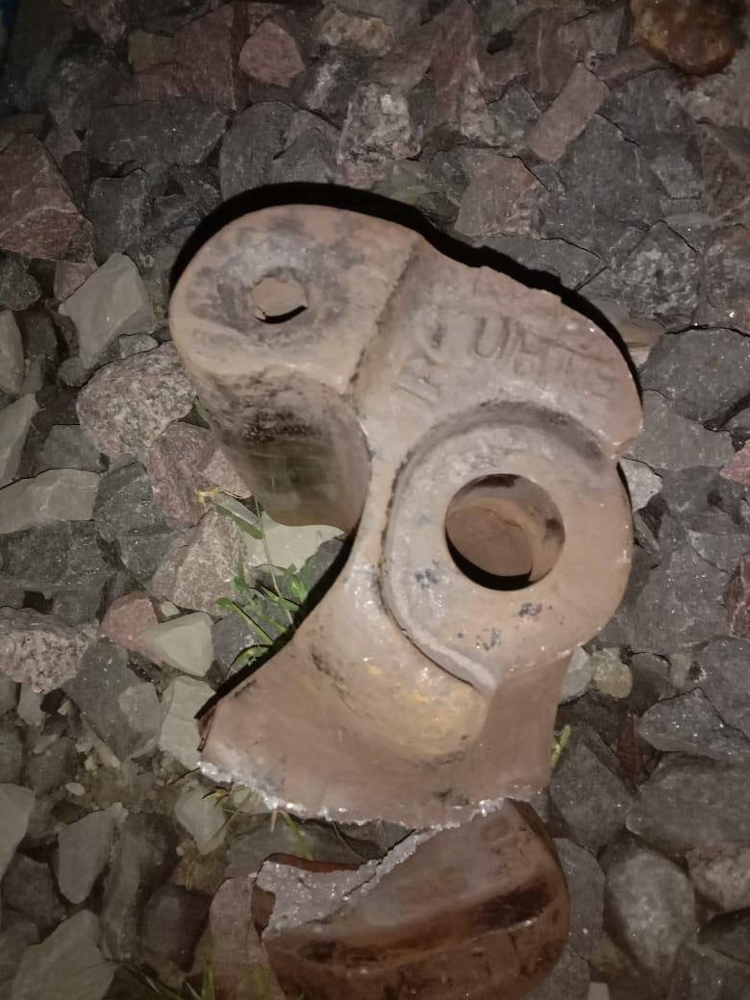

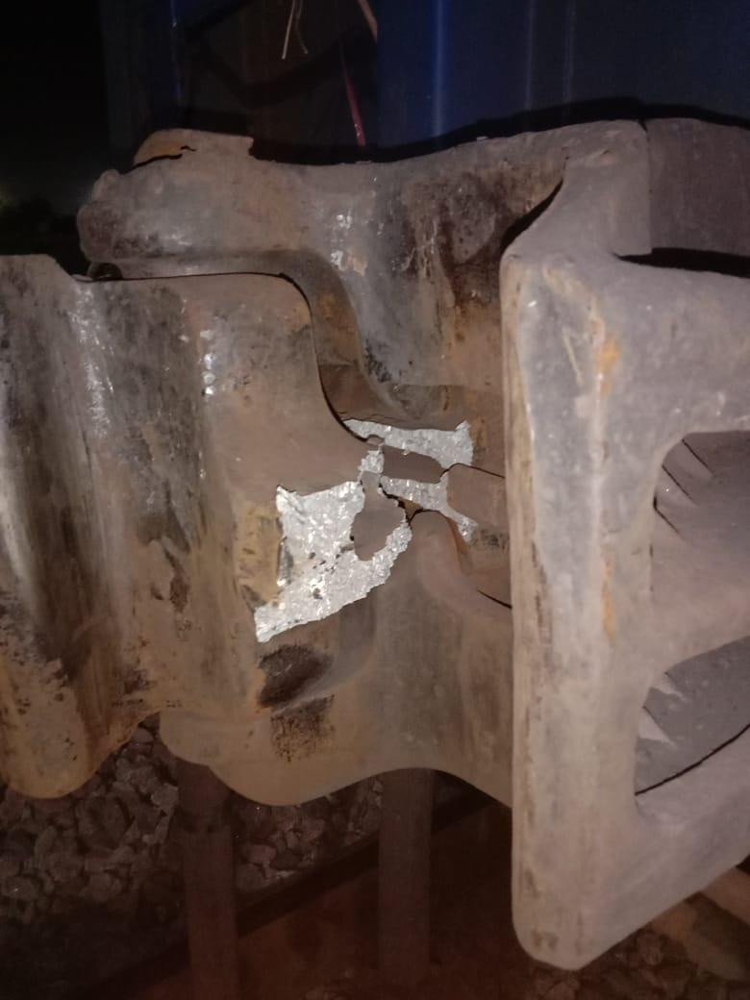

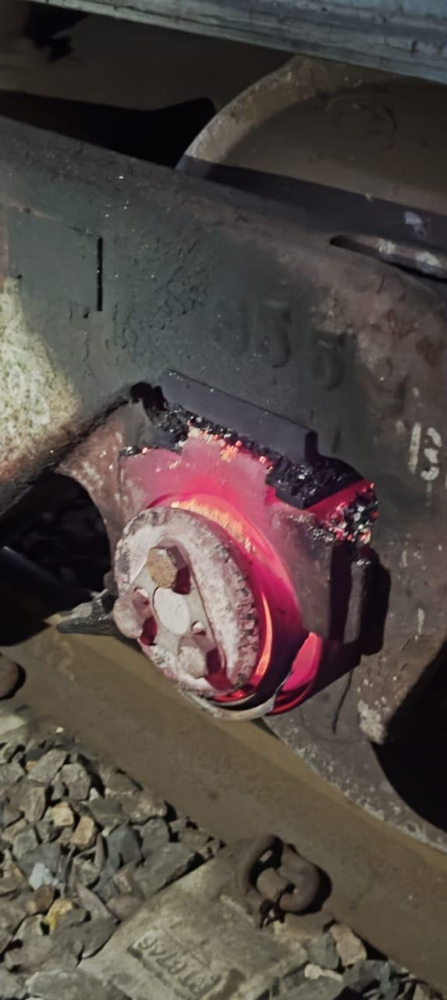

In [31]:
for i in range(min(20, len(predicted_images))):
    img_path = os.path.join(output_dir, predicted_images[i])
    display(Image(filename=img_path))

In [32]:
# 1. Install libraries
%pip install mlflow pyngrok ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.7/24.7 MB 84.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 74.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 242.7/242.7 kB 23.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.8/147.8 kB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 114.9/114.9 kB 12.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 9.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 733.8/733.8 kB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.4/203.4 kB 21.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.8/65.8 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.5/118.5 kB 13.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.2/196.2 kB 21.2 MB/s eta 0:00:00


In [44]:
# 2. Start MLflow UI and expose it with pyngrok
from pyngrok import ngrok
import threading

In [50]:
# Add your authtoken here
ngrok.set_auth_token("2x37djQBYiKtStTpbABhLL8XwuM_3RaK7yMctKoBP36VRZzxa")

In [51]:
# Define the database file
db_file = "sqlite:///mlruns.db"
os.environ['MLFLOW_TRACKING_URI'] = db_file

# Tell the UI to use the same database file
ui_command = f"mlflow ui --backend-store-uri {db_file} --port 5000 --host 0.0.0.0"
threading.Thread(target=lambda: os.system(ui_command)).start()

In [52]:
# Get public URL from pyngrok
public_url = ngrok.connect(5000)
print("Click this MLflow Tracking URL:", public_url)

Click this MLflow Tracking URL: NgrokTunnel: "https://fdb4-34-16-242-55.ngrok-free.app" -> "http://localhost:5000"


In [48]:
import mlflow

# Start an MLflow run
with mlflow.start_run(run_name="Simple Test"):
    print("Logging a test run to MLflow...")

    # Log a parameter
    mlflow.log_param("learning_rate", 0.01)

    # Log a metric
    mlflow.log_metric("accuracy", 0.95)

print("Test run logged successfully.")

Logging a test run to MLflow...
Test run logged successfully.


In [49]:
# 3. Resume training from your best model
# YOLO will automatically detect and log to MLflow
!yolo task=detect mode=train \
      model='/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect/train/weights/best.pt' \
      data='/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml' \
      epochs=100 \
      batch=32 \
      imgsz=640 \
      plots=True

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect/train/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3

WARNI [pyngrok.process.ngrok] t=2025-06-26T15:26:21+0000 lvl=warn msg="Stopping forwarder" name=http-5000-ae74c822-9fe9-4bd0-9458-c6bdbf00a946 acceptErr="failed to accept connection: Listener closed"
WARNI [pyngrok.process.ngrok] t=2025-06-26T15:26:21+0000 lvl=warn msg="Error restarting forwarder" name=http-5000-ae74c822-9fe9-4bd0-9458-c6bdbf00a946 err="failed to start tunnel: session closed"


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 1/1 [00:00<00:00,  1.88it/s]
                   all         17         56      0.889      0.929      0.962      0.618
Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/cfg/__init__.py", line 985, in entrypoint
    getattr(model, mode)(**overrides)  # default args from model
    ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/model.py", line 797, in train
    self.trainer.train()
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/trainer.py", line 227, in train
    self._do_train(world_size)
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/trainer.py", line 468, in _do_train
    self.save_model()
  File "/usr/local/lib/python3.11/dist-packages/ultralytics/engine/

In [53]:
%load_ext tensorboard

In [54]:
# Point it to the directory where all training runs are stored
%tensorboard --logdir '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect'

<IPython.core.display.Javascript object>

In [55]:
!yolo task=detect mode=train \
      model='/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect/train3/weights/best.pt' \
      data='/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml' \
      epochs=100 \
      optimizer=Adam \
      lr0=0.0005 \
      patience=50 \
      batch=32 \
      imgsz=640 \
      plots=True

Ultralytics 8.3.159 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/runs/detect/train3/weights/best.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=tra

In [9]:
# Define file paths
model_path = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/mlruns/1/be3bc7906dcf40d1b5a15b1df433d33f/artifacts/weights/best.pt'
image_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images'
label_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/labels'

# Create the output label folder
os.makedirs(label_folder, exist_ok=True)

# Load the fine-tuned model
model = YOLO(model_path)

# Run prediction, save images with boxes, but do not save txt files automatically
# We will create the txt files manually to control the output directory. [8]
results = model.predict(source=image_folder, save=True, conf=0.3)


image 1/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (1).jpeg: 480x640 (no detections), 188.3ms
image 2/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM (2).jpeg: 480x640 (no detections), 167.9ms
image 3/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.09 PM.jpeg: 640x384 (no detections), 141.2ms
image 4/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.10 PM (1).jpeg: 640x384 (no detections), 163.8ms
image 5/121 /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images/WhatsApp Image 2024-10-22 at 5.35.10 PM.jpeg: 640x384 (no detections), 138.1ms
im

In [10]:
# Process results to create label files
for r in results:
    # Define the output text file path based on the image name
    base_name = os.path.splitext(os.path.basename(r.path))[0]
    txt_path = os.path.join(label_folder, f"{base_name}.txt")

    with open(txt_path, 'w') as f:
        # Get normalized bounding boxes (xywhn) and class IDs
        boxes = r.boxes.xywhn
        classes = r.boxes.cls
        for i in range(len(boxes)):
            # Format: class_id center_x center_y width height
            line = f"{int(classes[i])} {boxes[i][0]} {boxes[i][1]} {boxes[i][2]} {boxes[i][3]}\n"
            f.write(line)

print(f"Label files saved to: {label_folder}")

# Display the first 2 predicted images
output_dir = results[0].save_dir
predicted_images = os.listdir(output_dir)

Label files saved to: /content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/labels


In [11]:
# 4. Process results into a list of dictionaries
dataframe_data = []
for r in results:
    filename = os.path.basename(r.path)
    num_detections = len(r.boxes)

    if num_detections == 0:
        # Add a row for images with no detections
        dataframe_data.append({
            'filename': filename,
            'detections_in_image': 0,
            'class_name': None,
            'bounding_box': None
        })
    else:
        # Iterate through each detection in the image
        for i in range(num_detections):
            box = r.boxes[i]
            class_name = model.names[int(box.cls)]
            coords = [round(c) for c in box.xyxy[0].tolist()]
            dataframe_data.append({
                'filename': filename,
                'detections_in_image': num_detections,
                'class_name': class_name,
                'bounding_box': coords
            })

In [18]:
# 5. Create and display the DataFrame
predictions_df = pd.DataFrame(dataframe_data)
display(predictions_df[(predictions_df['class_name'] != 'Wheel') & (predictions_df['class_name'].notna())])

,filename,detections_in_image,class_name,bounding_box
11,WhatsApp Image 2024-10-22 at 5.35.13 PM (1).jpeg,1,Discoloration,"[0, 994, 178, 1030]"
85,WhatsApp Image 2024-10-22 at 5.45.32 PM.jpeg,4,Cracks-Scratches,"[822, 561, 848, 678]"
90,WhatsApp Image 2024-10-22 at 5.45.34 PM (2).jpeg,1,Shelling,"[662, 792, 873, 843]"
100,WhatsApp Image 2024-10-22 at 5.45.37 PM (2).jpeg,1,Shelling,"[601, 97, 772, 150]"
129,WhatsApp Image 2024-10-22 at 5.47.06 PM (2).jpeg,1,Shelling,"[0, 548, 387, 637]"


In [19]:
predictions_df.shape

(131, 4)

Displaying drawn predictions for: WhatsApp Image 2024-10-22 at 5.35.13 PM (1).jpeg


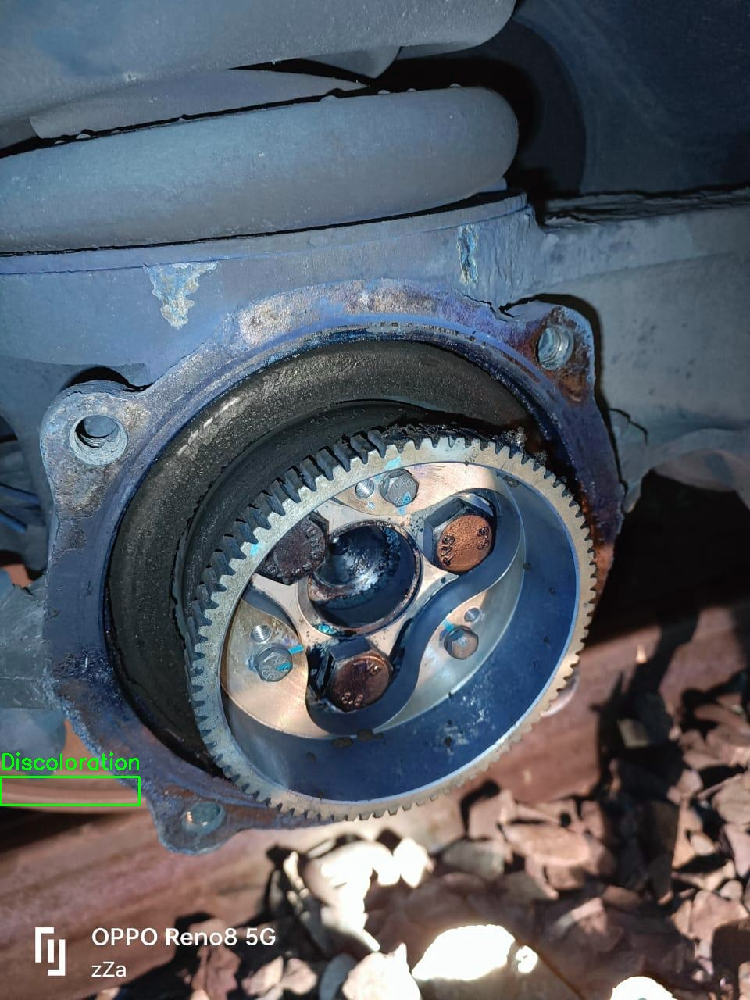

Displaying drawn predictions for: WhatsApp Image 2024-10-22 at 5.45.32 PM.jpeg


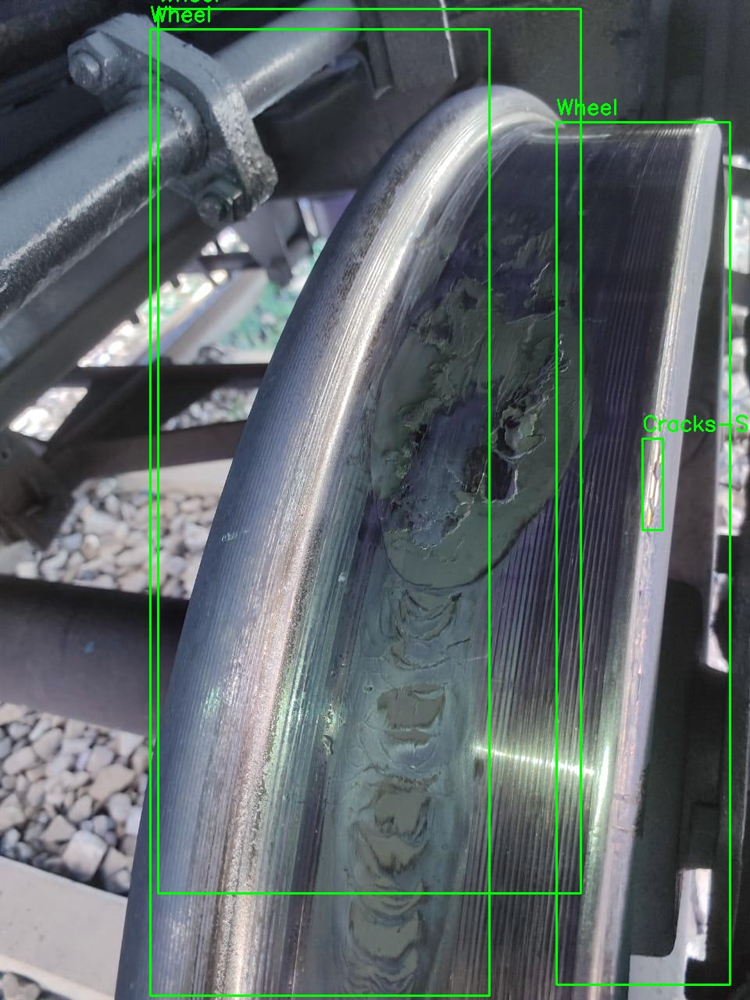

Displaying drawn predictions for: WhatsApp Image 2024-10-22 at 5.45.34 PM (2).jpeg


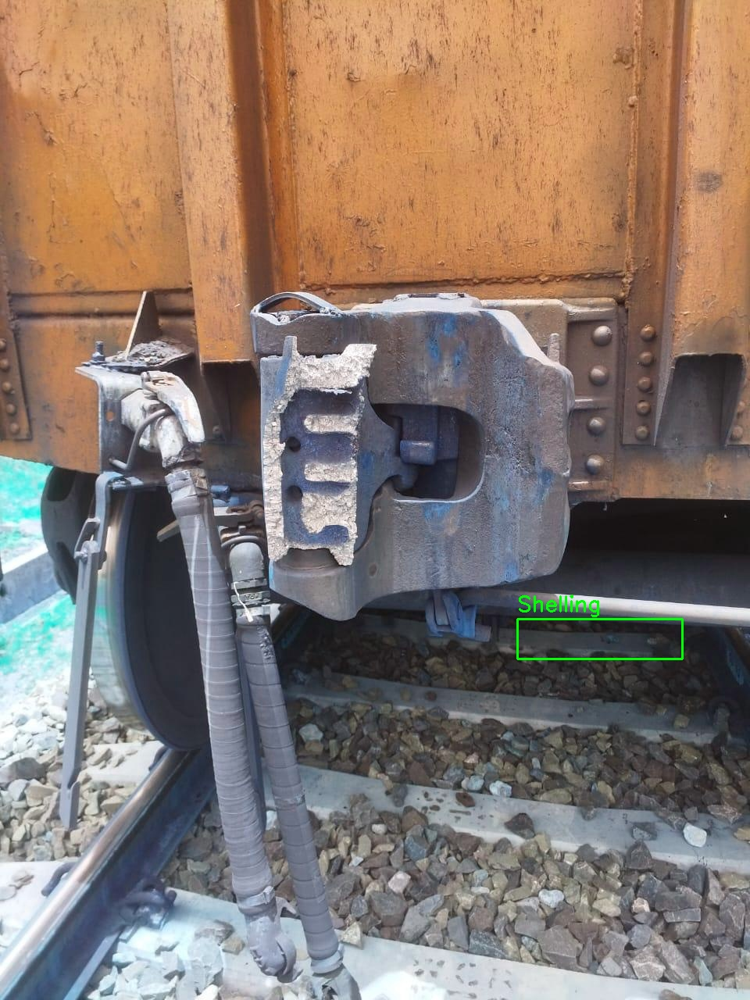

Displaying drawn predictions for: WhatsApp Image 2024-10-22 at 5.45.37 PM (2).jpeg


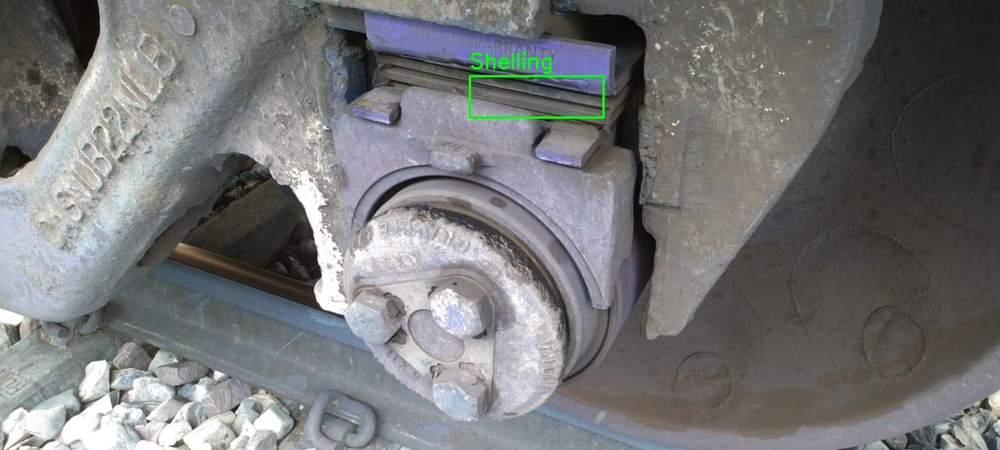

Displaying drawn predictions for: WhatsApp Image 2024-10-22 at 5.47.06 PM (2).jpeg


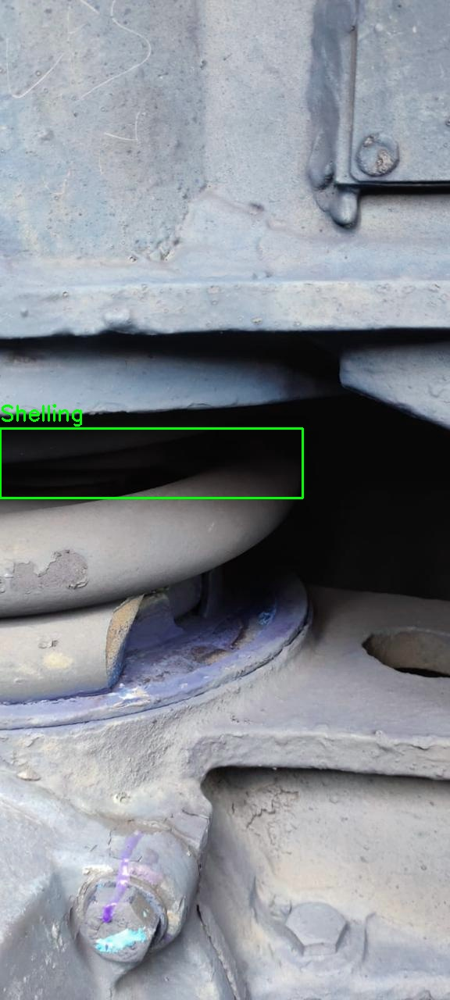

In [26]:
from IPython.display import display, Image
import os

# Define the folder where your test images are located
image_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images'

# Define the folder with the original images
image_folder = '/content/drive/MyDrive/Home2/datasets/Railway Defects Labelled Dataset/test/images/defective wagon images'

# Filter for the specific rows you want to display
selected_rows = predictions_df[(predictions_df['class_name'] != 'Wheel') & (predictions_df['class_name'].notna())].iloc[0:]

# Process each unique image in your selection
for filename in selected_rows['filename'].unique():
    # Load the original image
    image_path = os.path.join(image_folder, filename)
    image = cv2.imread(image_path)

    # Get all detections for this specific file from the DataFrame
    detections_for_image = predictions_df[predictions_df['filename'] == filename]

    # Draw each bounding box and label
    for _, row in detections_for_image.iterrows():
        box = row['bounding_box']
        label = row['class_name']

        # Draw rectangle: top-left (box[0], box[1]), bottom-right (box[2], box[3])
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), (0, 255, 0), 2)

        # Put label text above the box
        cv2.putText(image, label, (box[0], box[1] - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

    print(f"Displaying drawn predictions for: {filename}")
    # Convert from BGR (OpenCV) to RGB (Display) and show the image
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    display(Image(data=cv2.imencode('.jpg', image_rgb)[1].tobytes()))